In [1]:
import pandas as pd

In [156]:
df = pd.read_csv('filtered_comprehensive.csv')

In [157]:
df.columns

Index(['Unnamed: 0.3', 'Unnamed: 0.2', 'Unnamed: 0', 'Unnamed: 1',
       'Unnamed: 0.1', 'title_x', 'artist_x', 'year_x', 'key', 'Unnamed: 0_x',
       'url', 'WeekID', 'Week Position', 'Song', 'Performer', 'SongID',
       'Instance', 'Previous Week Position', 'Peak Position', 'Weeks on Chart',
       'Lyrics', 'Artist', 'words', 'wordCount', 'languages', 'all_words',
       'allWordCount', 'year_y', 'decade', 'MTLD', 'TTR', 'CTTR',
       'sentimentScore', 'sentimentScore_pos', 'sentimentScore_neg',
       'emo_words', 'emoWordCount', 'joy', 'joy_normalized', 'sadness',
       'sadness_normalized', 'anger', 'anger_normalized', 'disgust',
       'disgust_normalized', 'trust', 'trust_normalized', 'anticipation',
       'anticipation_normalized', 'fear', 'fear_normalized', 'surprise',
       'surprise_normalized', 'emo_score', 'happy', 'happy_normalized',
       'sorrow', 'sorrow_normalized', 'year', 'lower_title', 'Unnamed: 0_y',
       'title_y', 'artist_y', 'chartmetric_id', 'name',

In [160]:
extract = df[['title_x', 'artist_x', 'year_x','pronoun','gender','processed_tokens','decade']]
extract['decade'] = extract['year_x'].apply(lambda x : str(x)[2]+'0s')
extract['decade'].isna().sum()

/var/folders/lk/c66jcxc517j4m73kkh93rvwr0000gn/T/ipykernel_68671/916438009.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  extract['decade'] = extract['year_x'].apply(lambda x : str(x)[2]+'0s')


0

In [161]:
extract.head(15)

,title_x,artist_x,year_x,pronoun,gender,processed_tokens,decade
0,come softly to me,the fleetwoods,1959,they/them,NaN,"['come', 'softly', 'lyricsdoo', 'dooby', 'doo'...",50s
1,heartaches by the number,guy mitchell,1959,he/him,male,"['heartache', 'number', 'trouble', 'score', 'e...",50s
2,kansas city,wilbert harrison,1959,he/him,male,"['going', 'kansa', 'city', 'kansa', 'city', 'c...",50s
3,kansas city,wilbert harrison,1959,NaN,NaN,"['going', 'kansa', 'city', 'kansa', 'city', 'c...",50s
4,kansas city,wilbert harrison,1959,NaN,NaN,"['going', 'kansa', 'city', 'kansa', 'city', 'c...",50s
5,kansas city,hank ballard and the midnighters,1959,he/him,male,"['going', 'kansa', 'city', 'kansa', 'city', 'c...",50s
6,kansas city,hank ballard and the midnighters,1959,NaN,NaN,"['going', 'kansa', 'city', 'kansa', 'city', 'c...",50s
7,kansas city,hank ballard and the midnighters,1959,NaN,NaN,"['going', 'kansa', 'city', 'kansa', 'city', 'c...",50s
8,lonely boy,paul anka,1959,he/him,male,"['lonely', 'boy', 'lonely', 'blue', 'alone', '...",50s
9,mack the knife,bobby darin,1959,he/him,male,"['shark', 'babe', 'teeth', 'dear', 'show', 'pe...",50s


In [75]:
extract['gender'].value_counts()
gender_options = extract['gender'].unique()
gender_options

array([nan, 'male', 'female', 'mixed', 'androgynous', 'transgender woman',
       'genderfluid', 'non-binary', 'genderqueer'], dtype=object)

In [52]:
decadal_groups = extract.groupby(by=['decade']).agg('gender')
print(decadal_groups)

In [67]:
decade_gender = extract.groupby('decade')[['decade','gender']]
decade_gender

In [45]:
decades = extract['decade'].unique()
decades


array(['50s', '60s', '70s', '80s', '90s', '00s', '10s', '20s'],
      dtype=object)

In [116]:
male = []
female = []
others = []
for decade in decades:
    decade_df = decade_gender.get_group(decade)
    decades_final = decade_df.pivot_table(index="gender", columns="decade", values="gender", aggfunc=np.count_nonzero)
    male.append(int(decades_final.loc['male']))
    female.append(int(decades_final.loc['female']))
    try:
        mixed = int(decades_final.loc['mixed'])
    except:
        mixed = 0
    try:
        andr = int(decades_final.loc['androgynous'])
    except:
        andr = 0
    try:
        trans = int(decades_final.loc['transgender woman'])
    except:
        trans = 0
    try:
        gf = int(decades_final.loc['genderfluid'])
    except : 
        gf = 0
    try: 
        nb = int(decades_final.loc['non-binary'])
    except : 
        nb = 0
    others.append(mixed + andr + trans + gf + nb)
print('male', male)
print('female', female)
print('others', others)

male [428, 4568, 3720, 3240, 1946, 2714, 3882, 1434]
female [4, 258, 360, 444, 504, 990, 1304, 486]
others [0, 96, 110, 150, 80, 136, 520, 20]


In [110]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

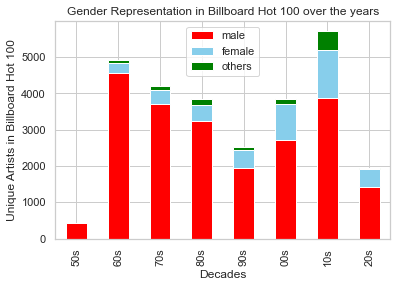

In [118]:
df = pd.DataFrame({'male': male,
                   'female': female, 'others' : others},
                  index=decades)
                  # create stacked bar chart for monthly temperatures
df.plot(kind='bar', stacked=True, color=['red', 'skyblue', 'green'])
 
# labels for x & y axis
plt.xlabel('Decades')
plt.ylabel('Unique Artists in Billboard Hot 100')
 
# title of plot
plt.title('Gender Representation in Billboard Hot 100 over the years')

plt.savefig('gender-decades.png', dpi=300)


/var/folders/lk/c66jcxc517j4m73kkh93rvwr0000gn/T/ipykernel_68671/4224842065.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_perct['male'] = df['male']*100/df['total']
/var/folders/lk/c66jcxc517j4m73kkh93rvwr0000gn/T/ipykernel_68671/4224842065.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_perct['female'] = df['female']*100/df['total']
/var/folders/lk/c66jcxc517j4m73kkh93rvwr0000gn/T/ipykernel_68671/4224842065.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from

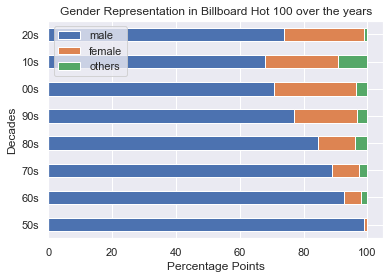

In [132]:
df['total'] =  df['male'] + df['female'] + df['others']
df_perct = df[['male','female','others']]
df_perct['male'] = df['male']*100/df['total']
df_perct['female'] = df['female']*100/df['total']
df_perct['others'] = 100 - df_perct['female'] - df_perct['male']
df_perct.plot(
    kind = 'barh',
    stacked = True,
    title = 'Stacked Bar Graph',
    mark_right = True)
df_perct

# labels for x & y axis
plt.xlabel('Percentage Points')
plt.ylabel('Decades')
 
# title of plot
plt.title('Gender Representation in Billboard Hot 100 over the years')

plt.savefig('gender-decades-perct.png', dpi=300)

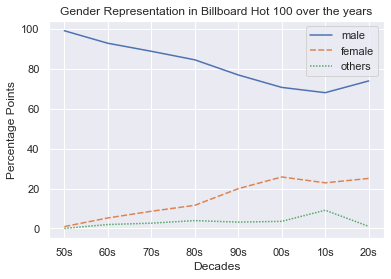

In [131]:
import seaborn as sns
sns.set_theme(style="darkgrid")
sns.lineplot(data=df_perct)
# labels for x & y axis
plt.xlabel('Decades')
plt.ylabel('Percentage Points')
 
# title of plot
plt.title('Gender Representation in Billboard Hot 100 over the years')

plt.savefig('gender-decades-perct-line.png', dpi=300)

In [162]:
extract['tokens_list'] = extract['processed_tokens'].apply(lambda x: x.strip('][').split(', '))
extract

/var/folders/lk/c66jcxc517j4m73kkh93rvwr0000gn/T/ipykernel_68671/3669112088.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  extract['tokens_list'] = extract['processed_tokens'].apply(lambda x: x.strip('][').split(', '))


,title_x,artist_x,year_x,pronoun,gender,processed_tokens,decade,tokens_list
0,come softly to me,the fleetwoods,1959,they/them,NaN,"['come', 'softly', 'lyricsdoo', 'dooby', 'doo'...",50s,"['come', 'softly', 'lyricsdoo', 'dooby', 'doo'..."
1,heartaches by the number,guy mitchell,1959,he/him,male,"['heartache', 'number', 'trouble', 'score', 'e...",50s,"['heartache', 'number', 'trouble', 'score', 'e..."
2,kansas city,wilbert harrison,1959,he/him,male,"['going', 'kansa', 'city', 'kansa', 'city', 'c...",50s,"['going', 'kansa', 'city', 'kansa', 'city', 'c..."
3,kansas city,wilbert harrison,1959,NaN,NaN,"['going', 'kansa', 'city', 'kansa', 'city', 'c...",50s,"['going', 'kansa', 'city', 'kansa', 'city', 'c..."
4,kansas city,wilbert harrison,1959,NaN,NaN,"['going', 'kansa', 'city', 'kansa', 'city', 'c...",50s,"['going', 'kansa', 'city', 'kansa', 'city', 'c..."
...,...,...,...,...,...,...,...,...
23766,7 days,youngboy never broke again,2022,he/him,male,"['day', 'intro', 'got', 'hitman', 'beat', 'lov...",20s,"['day', 'intro', 'got', 'hitman', 'beat', 'lov..."
23767,brambleton,pusha t,2022,he/him,male,"['brambleton', 'intro', 'pusha', 'pharrell', '...",20s,"['brambleton', 'intro', 'pusha', 'pharrell', '..."
23768,"burn, burn, burn",zach bryan,2022,he/him,male,"['burn', 'burn', 'burn', 'well', 'everyone', '...",20s,"['burn', 'burn', 'burn', 'well', 'everyone', '..."
23769,down home,jimmie allen,2022,he/him,male,"['home', 'bet', 'makin', 'new', 'friend', 'pre...",20s,"['home', 'bet', 'makin', 'new', 'friend', 'pre..."


In [163]:
from pandas import concat
import time
start = time.time()
concat_tokens = extract.groupby(by=['decade','gender']).agg({'tokens_list': 'sum'})
print(time.time()-start)

20.64516305923462


In [164]:
concat_tokens

tokens_list
decade gender                                                              
00s    female             ['come', 'come', 'baby', 'come', 'come', 'baby...
       genderfluid        ['call', 'leave', 'alone', 'gonna', 'answer', ...
       male               ['monday', 'night', 'feel', 'low', 'count', 'h...
       mixed              ['dress', 'hair', 'always', 'mess', 'catch', '...
       non-binary         ['walk', 'away', 'like', 'always', 'time', 'ba...
       transgender woman  ['alright', 'yeah', 'wandering', 'street', 'wo...
10s    androgynous        ['done', 'messed', 'around', 'fun', 'dont', 'p...
       female             ['snoop', 'dogg', 'greeting', 'loved', 'one', ...
       genderfluid        ['rock', 'mafia', 'know', 'get', 'bit', 'crazy...
       genderqueer        ['hook', 'need', 'gangsta', 'love', 'better', ...
       male               ['ohhhhhohhhhhh', 'ohhhhhhohhhhhhh', 'eye', 'e...
       mixed              ['ohhhhhohhhhhh', 'ohhhhhhohhhhhhh', 'eye', 'e...
       non-binary         ['sky', 'cry', 'watching', 'catching', 'tear',...
20s    female             ['vintage', 'tee', 'brand', 'new', 'phone', 'h...
       genderfluid        ['lala', 'yeah', 'long', 'night', 'mirror', 't...
       genderqueer        ['kehlani', 'damn', 'right', 'take', 'turn', '...
       male               ['yeah', 'tryna', 'call', 'long', 'enough', 'm...
       mixed              ['hillary', 'scott', 'charles', 'kelley', 'sta...
       non-binary         ['flippin', 'magazine', 'tellin', 'supposed', ...
50s    female             ['hook', 'love', 'porgy', 'let', 'take', 'let'...
       male               ['heartache', 'number', 'trouble', 'score', 'e...
60s    female             ['ueber', 'rio', 'und', 'shanghai', 'ueber', '...
       male               ['west', 'texas', 'town', 'paso', 'fell', 'lov...
       mixed              ['john', 'lennon', 'hard', 'day', 'night', 'wo...
70s    female             ['need', 'call', 'matter', 'matter', 'far', 'c...
       male               ['weary', 'feeling', 'small', 'tear', 'eye', '...
       mixed              ['bird', 'suddenly', 'appear', 'every', 'time'...
80s    female             ['one', 'time', 'never', 'enough', 'man', 'lik...
       male               ['produced', 'john', 'lennon', 'yoko', 'ono', ...
       mixed              ['colour', 'colour', 'baby', 'colour', 'car', ...
90s    androgynous        ['even', 'darkest', 'phase', 'thick', 'thin', ...
       female             ['moment', 'saw', 'went', 'outta', 'mind', 'th...
       male               ['come', 'mmm', 'like', 'angel', 'seems', 'lik...
       mixed              ['hold', 'tight', 'know', 'little', 'bit', 'da...

In [184]:
from collections import defaultdict
def freq_dict(words):
    fq = defaultdict( int )
    for w in words:
        w = w.replace("'",'')
        fq[w] += 1
    return fq


In [206]:
decades
gender_options.remove(np.nan)

In [207]:
decades
gender_options

['male',
 'female',
 'mixed',
 'androgynous',
 'transgender woman',
 'genderfluid',
 'non-binary',
 'genderqueer']

In [185]:

# fem_00_fq = concat_tokens.loc['00s', 'female'].tolist()[0]
# print(type(fem_00_fq))


<class 'list'>


In [ ]:
# fq = freq_dict(fem_00_fq)

In [208]:
from wordcloud import WordCloud
wordcloud = WordCloud(width=1600, height=800)

'mixed'
Unsuccesful 50s mixed
'androgynous'
Unsuccesful 50s androgynous
'transgender woman'
Unsuccesful 50s transgender woman
'genderfluid'
Unsuccesful 50s genderfluid
'non-binary'
Unsuccesful 50s non-binary
'genderqueer'
Unsuccesful 50s genderqueer
'androgynous'
Unsuccesful 60s androgynous
'transgender woman'
Unsuccesful 60s transgender woman
'genderfluid'
Unsuccesful 60s genderfluid
'non-binary'
Unsuccesful 60s non-binary
'genderqueer'
Unsuccesful 60s genderqueer
'androgynous'
Unsuccesful 70s androgynous
'transgender woman'
Unsuccesful 70s transgender woman
'genderfluid'
Unsuccesful 70s genderfluid
'non-binary'
Unsuccesful 70s non-binary
'genderqueer'
Unsuccesful 70s genderqueer
'androgynous'
Unsuccesful 80s androgynous
'transgender woman'
Unsuccesful 80s transgender woman
'genderfluid'
Unsuccesful 80s genderfluid
'non-binary'
Unsuccesful 80s non-binary
'genderqueer'
Unsuccesful 80s genderqueer
'transgender woman'
Unsuccesful 90s transgender woman
'genderfluid'
Unsuccesful 90s gender

/var/folders/lk/c66jcxc517j4m73kkh93rvwr0000gn/T/ipykernel_68671/3675461003.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure( figsize=(20,10) )


'genderqueer'
Unsuccesful 00s genderqueer
'transgender woman'
Unsuccesful 10s transgender woman
'androgynous'
Unsuccesful 20s androgynous
'transgender woman'
Unsuccesful 20s transgender woman


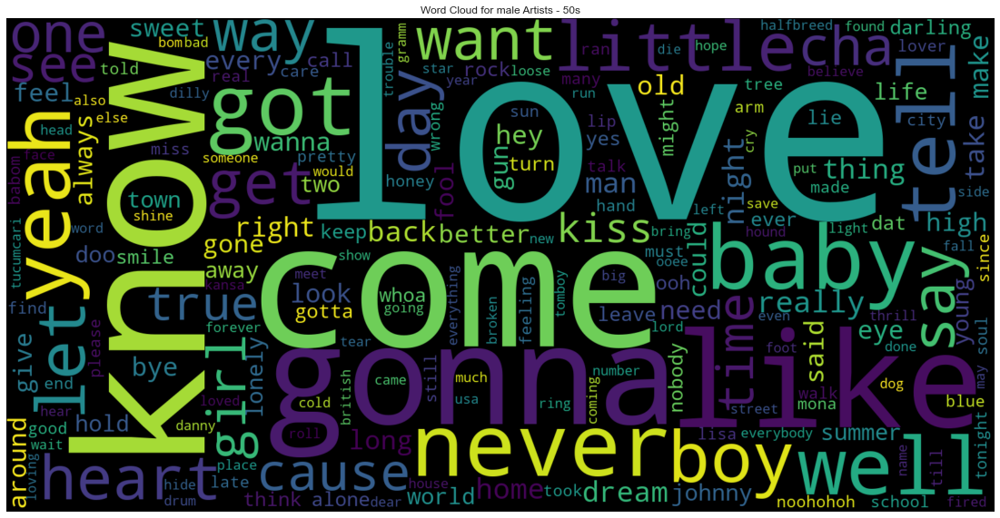

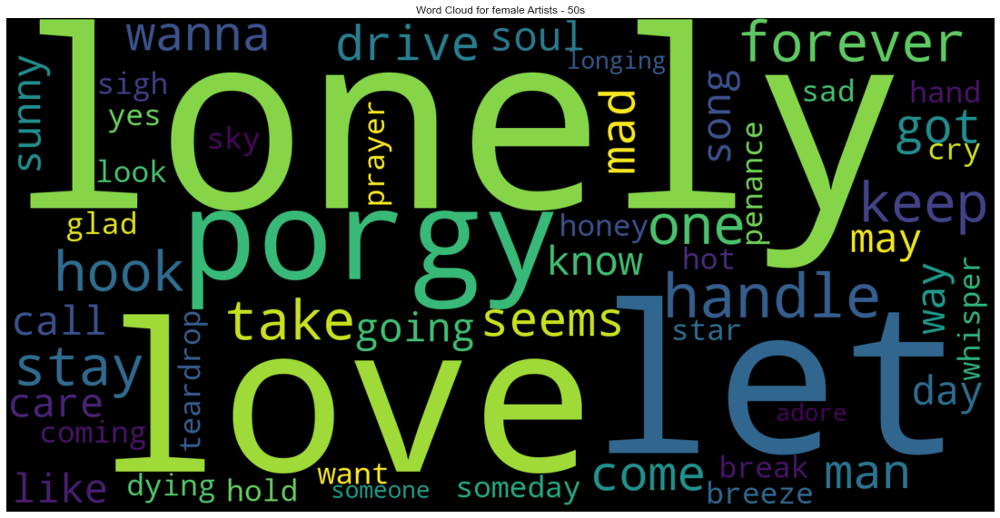

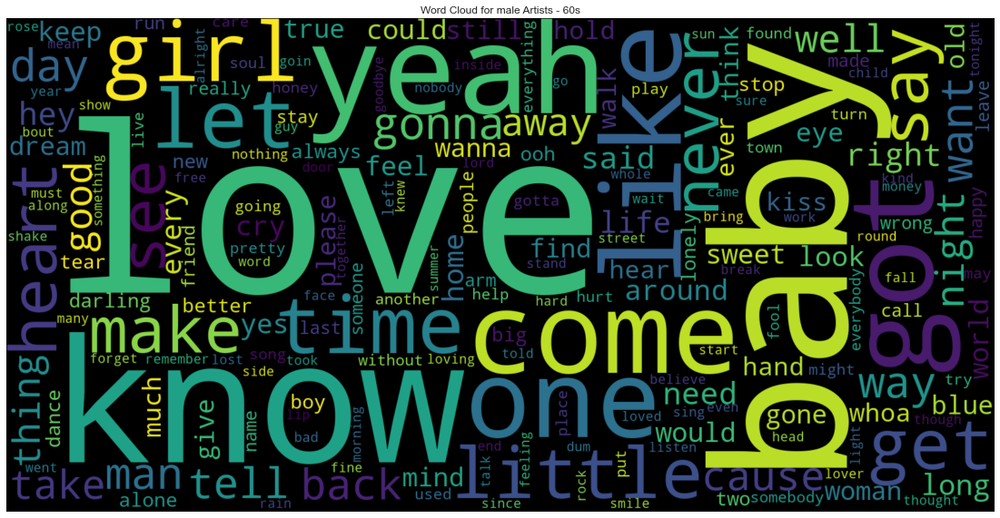

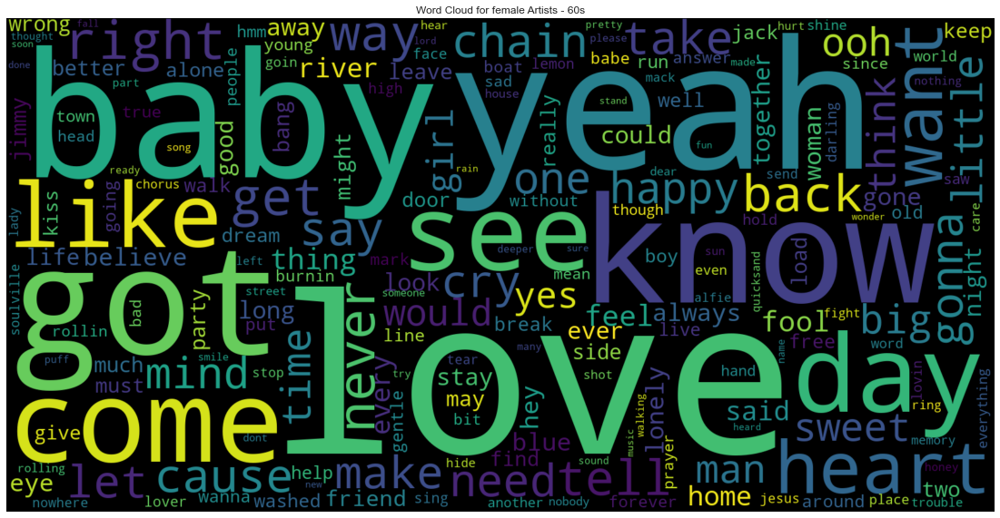

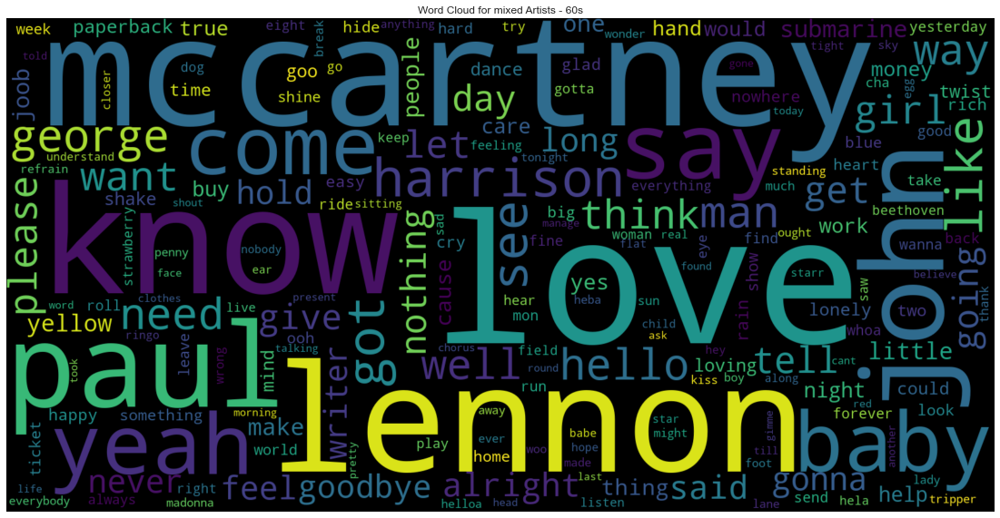

...

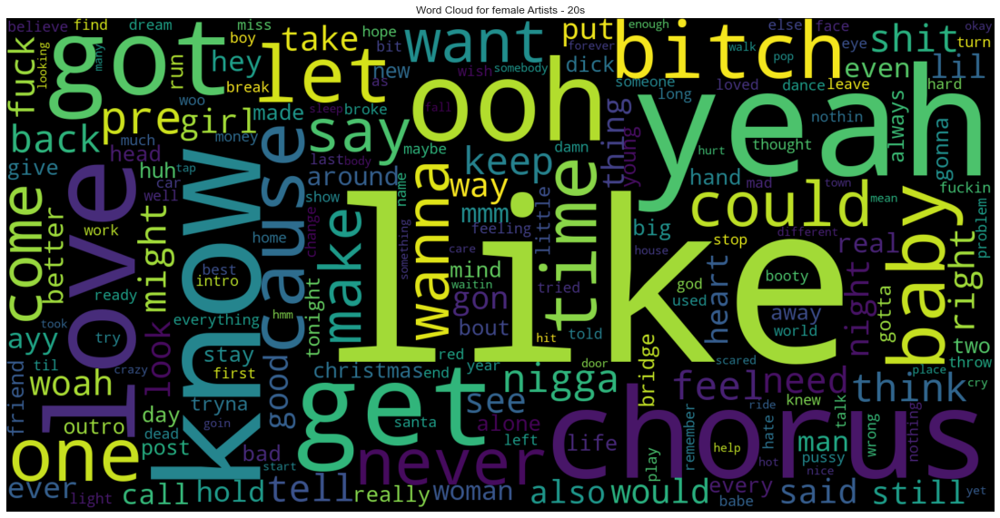

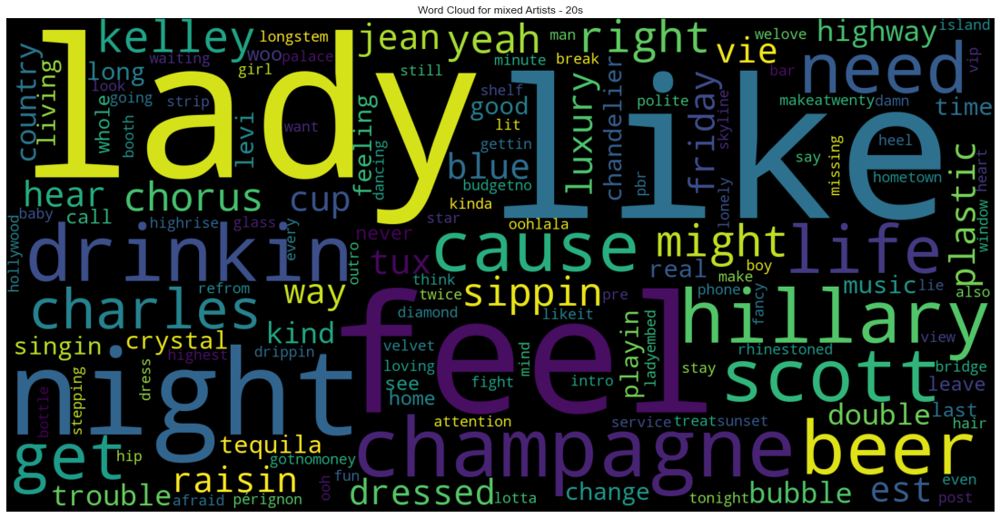

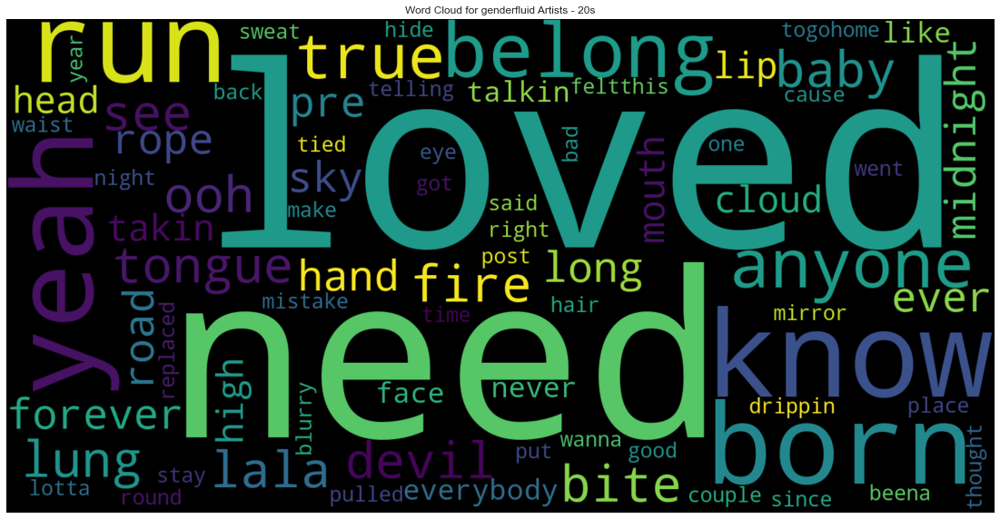

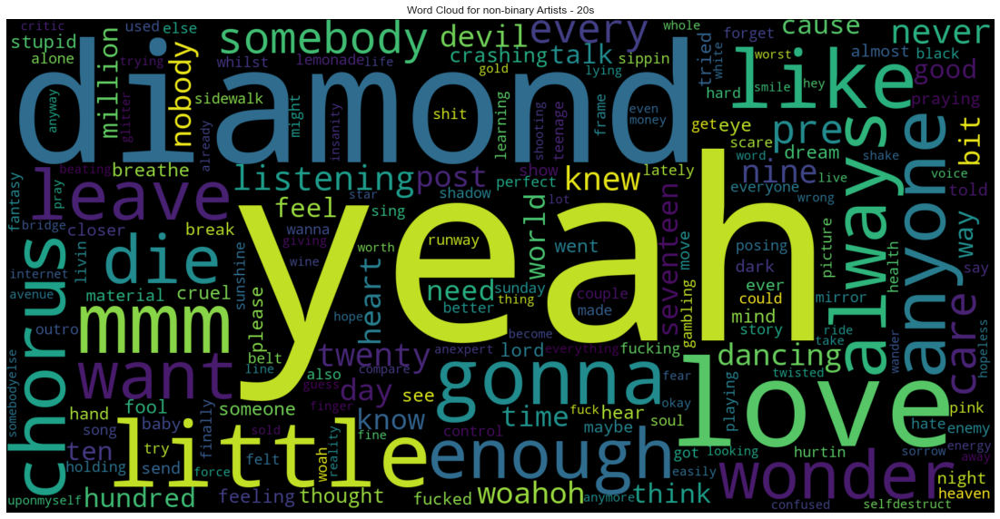

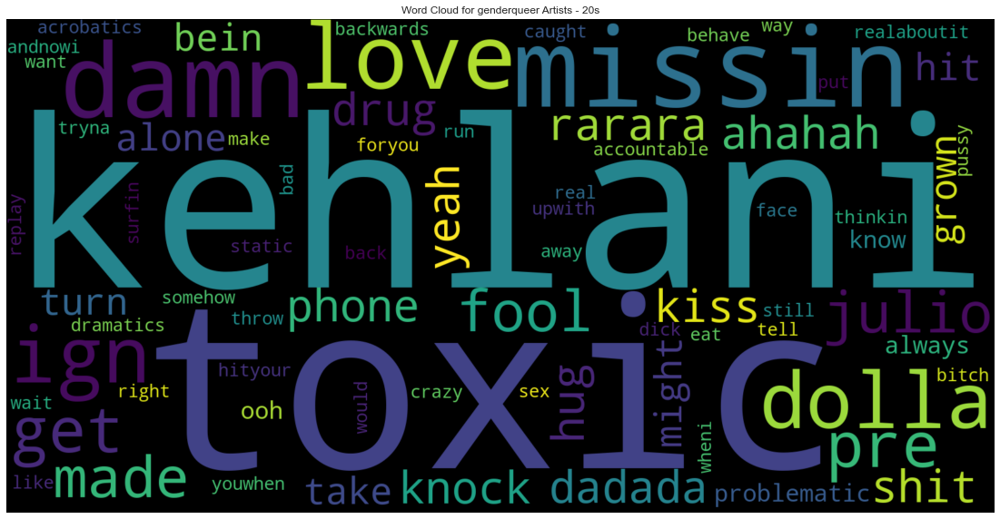

In [215]:
for decade in decades:
    for gd_opt in gender_options:
        try:
            fq = concat_tokens.loc[decade, gd_opt].tolist()[0]
            fq2 = freq_dict(fq)
            wordcloud.generate_from_frequencies(frequencies=fq2)
            plt.figure( figsize=(20,10) )
            plt.tight_layout(pad=0)
            plt.imshow(wordcloud, interpolation="bilinear")
            plt.axis("off")
            plt.title("Word Cloud for "+gd_opt+" Artists - "+decade)
            # plt.show()
            plt.savefig(decade+"-"+gd_opt+'.png', dpi=300, bbox_inches='tight')
        except Exception as e:
            print(e)
            print("Unsuccesful",decade,gd_opt)

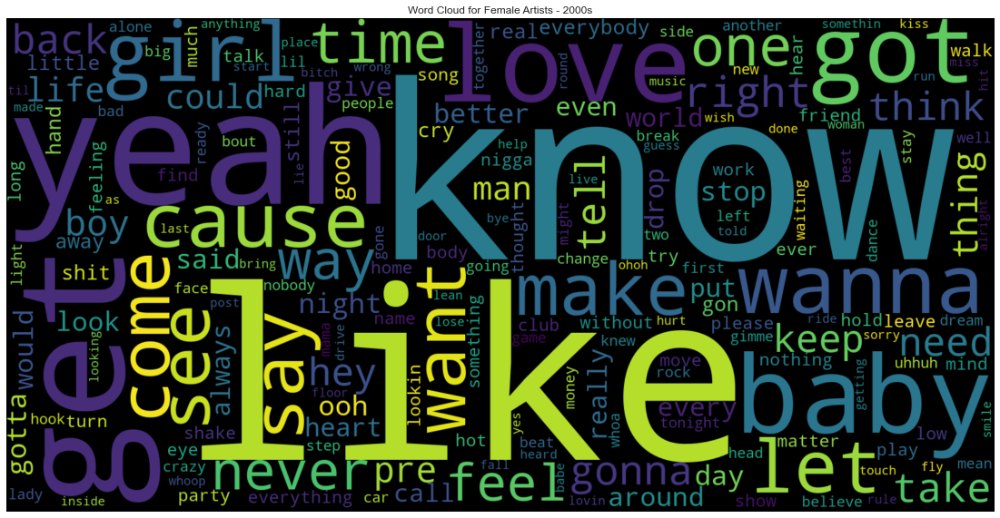